### Lê as informações estruturadas dos arquivos csv da pasta raw_data e os empilha em um único dataframe, df_empilhado

In [1]:
%load_ext autoreload
%autoreload 2

import string
import unidecode
import re
import nltk
import matplotlib.pyplot as plt
import pandas as pd
import os
from tqdm import tqdm

tqdm.pandas()

cols = ['id','Classe','Assunto','Magistrado','Comarca','Foro','Vara','Data_disp']
df_empilhado = pd.DataFrame(columns = cols)

directory = "dados/raw_data/"
for filename in tqdm(os.listdir(directory)):
    try:
        if filename.endswith(".csv"): 
            df_decisoes = pd.read_csv(os.path.join(directory, filename))
            df_empilhado = pd.concat([df_empilhado, df_decisoes], ignore_index = True)
    except:
        e = sys.exc_info()[0]
        print(e)

C:\ProgramData\Anaconda3\lib\site-packages\tqdm\std.py:648: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel
  0%|          | 0/435 [00:00<?, ?it/s]C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

100%|██████████| 435/435 [09:53<00:00,  1.36s/it]


### Removendo documentos repetidos

In [19]:
df = df_empilhado.drop_duplicates(subset='id', keep="first").drop(["Teor_preprocessado", "Unnamed: 0", "T"], axis = 1)
df.to_csv("dados/corpus_tratado/metadados.csv")
df

,Assunto,Classe,Comarca,Data_disp,Foro,Magistrado,Teor,Vara,id
0,Tráfico de Drogas e Condutas Afins,Procedimento Especial da Lei Antitóxicos,Salto,25/10/2019,Foro de Salto,CHRISTIANO RODRIGO GOMES DE FREITAS,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,3ª Vara,1500075-43.2019.8.26.0569
1,Alienação Fiduciária,Busca e Apreensão em Alienação Fiduciária,Santos,25/10/2019,Foro de Santos,RAFAEL DA CRUZ GOUVEIA LINARDI,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,8ª Vara Cível,1019468-32.2019.8.26.0562
2,Usucapião Ordinária,Usucapião,Conchas,25/10/2019,Foro de Conchas,André Rodrigues Menk,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,1ª Vara,0002184-57.2015.8.26.0145
3,Furto,Ação Penal - Procedimento Ordinário,Guararema,25/10/2019,Foro de Guararema,Vanêssa Christie Enande,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,Vara Única,0000043-68.2019.8.26.0616
4,DIREITO PREVIDENCIÁRIO,Procedimento Comum Cível,Jacareí,25/10/2019,Foro de Jacareí,PAULO ALEXANDRE AYRES DE CAMARGO,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,1ª Vara Cível,1007259-02.2018.8.26.0292
...,...,...,...,...,...,...,...,...,...
3166850,Impostos,Execução Fiscal,Araraquara,17/10/2019,Foro de Araraquara,João Baptista Galhardo Júnior,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,1º Vara da Fazenda Pública,1514316-66.2019.8.26.0037
3166851,Indenização por Dano Material,Procedimento do Juizado Especial Cível,Limeira,17/10/2019,Foro de Limeira,Marcelo Vieira,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,Vara do Juizado Especial Cível e Criminal,1008737-24.2019.8.26.0320
3166852,IPTU/ Imposto Predial e Territorial Urbano,Requisição de Pequeno Valor,NaN,17/10/2019,NaN,Luciana Mezzalira Mendonça de Barros,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,NaN,0000206-22.2019.8.26.0075
3166853,Compromisso,Execução de Título Extrajudicial,Patrocínio Paulista,17/10/2019,Foro de Patrocínio Paulista,FERNANDO DA FONSECA GAJARDONI,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,Juizado Especial Cível,1000043-73.2018.8.26.0426


In [45]:
lista_ids_validos = df_empilhado.id.unique()
df = pd.DataFrame(columns = cols)
for id in tqdm(lista_ids_validos):
    df = df.append(df_empilhado.loc[df_empilhado.id == id].reset_index().iloc[0])
df.shape

100%|██████████| 40009/40009 [1:49:46<00:00,  6.07it/s]


(40009, 13)

In [46]:
for col in cols[0:6]:
    nome_tabela = 'tabela_' + col + '.txt'
    tabela = pd.DataFrame(df[col].str.lower().value_counts())
    tabela['%'] = round((df[col].str.lower().value_counts()/df.shape[0])*100, 5)
    tabela.columns = ['Quantidade', '%']
    tabela['Quantidade'] = tabela['Quantidade'].apply(lambda x : "{:,}".format(x).replace(',', '.'))
    tabela.reset_index().to_csv(nome_tabela, sep = '\t', float_format='%.2f', index=False, decimal = ',')

In [11]:
round((df['Vara'].value_counts()/df.shape[0])*100, 5)

Vara da Fazenda Pública                            6.57102
Vara do Juizado Especial Cível e Criminal          5.06386
1ª Vara Cível                                      5.01137
Juizado Especial Cível e Criminal                  4.96388
2ª Vara Cível                                      4.87390
                                                    ...   
3ª Vara da Família e das Sucessões                 0.00250
Vara da Infância e Juventude e do Idoso            0.00250
Anexo Juizado Especial Cível                       0.00250
Vara Reg.Oeste de Viol. Dom. e Fam.Cont.Mulher     0.00250
1ª Vara das Execuções Criminais e Anexo do Júri    0.00250
Name: Vara, Length: 253, dtype: float64

In [12]:
tabela_classe = pd.DataFrame(df['Vara'].str.lower().value_counts())
tabela_classe['%'] = round((df['Vara'].str.lower().value_counts()/df.shape[0])*100, 5)
tabela_classe.columns = ['Quantidade', '%']
tabela_classe.head(20)

,Quantidade,%
vara da fazenda pública,2629,6.57102
juizado especial cível e criminal,2032,5.07886
vara do juizado especial cível e criminal,2026,5.06386
1ª vara cível,2005,5.01137
2ª vara cível,1968,4.91889
1ª vara,1944,4.85891
vara única,1932,4.82891
3ª vara cível,1922,4.80392
saf - serviço de anexo fiscal,1889,4.72144
2ª vara,1406,3.51421


In [13]:
df1 = tabela_classe[0:57].reset_index()
df2 = tabela_classe[57:114].reset_index()
df_final = pd.concat([df1, df2], axis = 0)
tabela_classe['Quantidade'] = tabela_classe['Quantidade'].apply(lambda x : "{:,}".format(x).replace(',', '.'))
tabela_classe.to_csv('tabela_varas.txt', sep = '\t', float_format='%.5f', index=False, decimal = ',')

40009it [00:16, 2497.98it/s]


id


None

40009

0

ValueError: Image size of 720x1440324 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 720x1.44032e+06 with 1 Axes>

114it [00:00, 3263.00it/s]


Classe


None

114

376

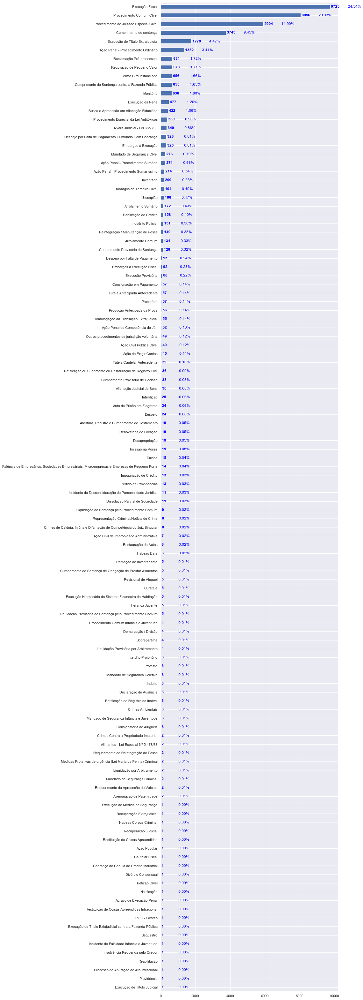

717it [00:00, 3125.27it/s]


Assunto


None

717

0

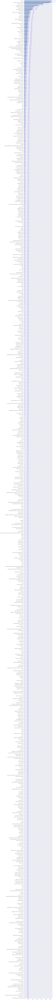

1801it [00:00, 3150.93it/s]


Magistrado


None

1801

37

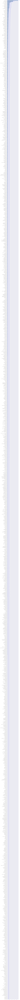

318it [00:00, 3037.55it/s]


Comarca


None

318

1693

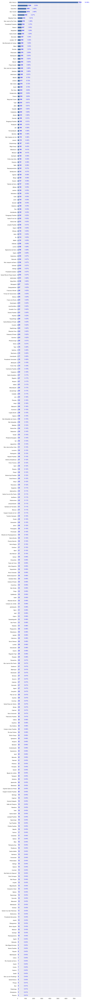

347it [00:00, 3282.16it/s]


Foro


None

347

1693

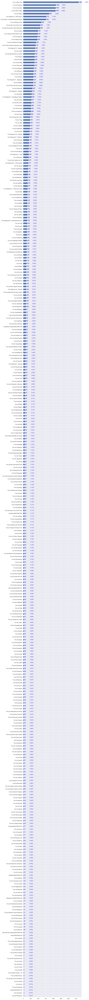

253it [00:00, 3293.15it/s]


Vara


None

253

1693

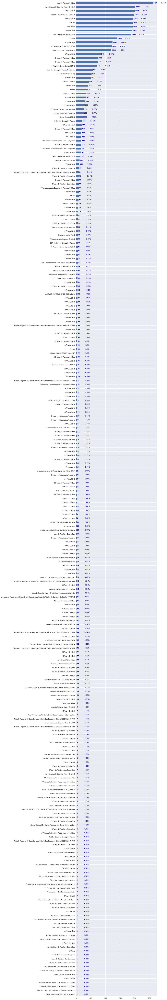

15it [00:00, 3016.76it/s]


Data_disp


None

15

0

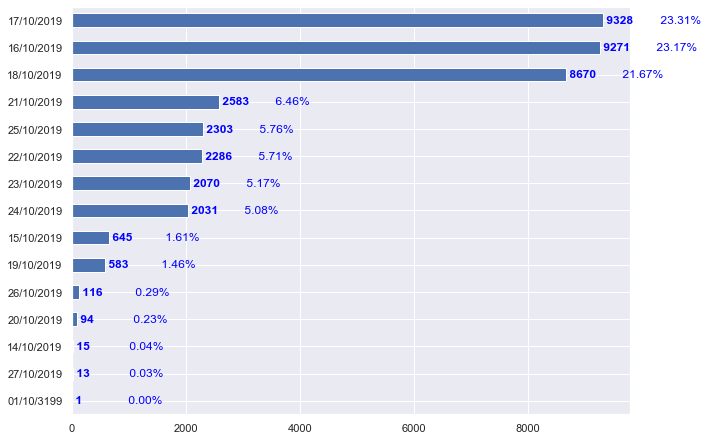

In [50]:
import seaborn as sns
sns.set()
for col in cols:
    variavel = col
    ax = df[variavel].value_counts().sort_values().plot(kind = 'barh', figsize=(10,df[variavel].nunique()/2))
    offset = df[variavel].value_counts().max() * 0.1
    denom = df[variavel].value_counts().sum()
    for i, v in tqdm(enumerate(df[variavel].value_counts().sort_values())):
        plt.text(v, i, " "+str(v), color='blue', va='center', fontweight='bold')
        plt.text(v + offset, i, " "+str('{0:.2f}'.format((v/denom)*100))+"%", color='blue', va='center')
    display(print(col))
    display(df[variavel].nunique())
    display(df[variavel].isnull().sum())
    plt.show()

In [46]:
assuntos_comuns = df_grafo.Assunto.str.lower().value_counts().head(20).reset_index()
assuntos_comuns.columns = ['Assunto', 'Quantidade de classes onde o assunto aparece']
assuntos_comuns.to_csv('assuntos_classes.txt', sep = '\t', float_format='%.2f', index=False, decimal = ',')

In [72]:
datas = df.groupby('Data_disp').size().to_frame(name = 'Quant').reset_index()
datas = datas.sort_values('Quant', ascending=False).reset_index()
datas['%'] = (datas['Quant']/sum(datas['Quant']))*100
datas = pd.concat([datas[0:7].reset_index(), datas[7:14].reset_index()], axis = 1).drop(['level_0', 'index'], axis = 'columns')
datas.to_csv('datas.txt', sep = '\t', float_format='%.2f', index=False, decimal = ',')

In [52]:
df_grafo = df.groupby(['Classe', 'Assunto']).size().to_frame(name = 'Quant').reset_index()
df_grafo.sort_values('Quant', ascending=False).head(10)

,Classe,Assunto,Quant
831,Execução Fiscal,Dívida Ativa,3062
841,Execução Fiscal,IPTU/ Imposto Predial e Territorial Urbano,2919
816,Execução Fiscal,Assunto não informado.,1720
1710,Procedimento do Juizado Especial Cível,Indenização por Dano Moral,657
1417,Procedimento Comum Cível,Indenização por Dano Moral,607
1736,Procedimento do Juizado Especial Cível,Obrigação de Fazer / Não Fazer,603
1416,Procedimento Comum Cível,Indenização por Dano Material,520
845,Execução Fiscal,ISS/ Imposto sobre Serviços,407
1709,Procedimento do Juizado Especial Cível,Indenização por Dano Material,404
849,Execução Fiscal,Impostos,367


In [114]:
from graphviz import Digraph, Source
import pylab
import pydotplus
df_grafo = df_empilhado.groupby(['Classe', 'Assunto']).size().to_frame(name = 'Quant').reset_index()
assuntos_comuns_top_30 = df_grafo.Assunto.value_counts().head(30).reset_index()['index'].tolist()

df_g = df_grafo.loc[df_grafo.Assunto.isin(assuntos_comuns_top_30)]

g = Digraph('G', filename='process.gv', engine='sfdp')
g.attr('graph', overlap='scale')

for index, row in df_g.iterrows():
    g.edge(str(row["Classe"]), str(row["Assunto"]), label='')

    
g.save("g.dot")

'g.dot'

In [124]:
import nltk
stemmer = nltk.stem.RSLPStemmer()
stemmer.stem('cheguei')

'cheg'